<a href="https://colab.research.google.com/github/SudheerReddyBandi/AnnaUniversity_Conference/blob/main/More_epochs_yolov8_1_obb_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#https://github.com/HossamEldinx/yolo-v8.1-OBB/blob/main/OBB_YOLO_V8_1.ipynb
#https://www.youtube.com/watch?v=UG4W3yBTJzM
#https://youtu.be/9i2LmwFDQLw?si=xajZ_iQnXJNWM2uo
#https://www.kaggle.com/code/hossamfakher/money-detection-yolov8-obb
#https://github.com/ultralytics/ultralytics/issues/624
#https://joelnadarai.medium.com/train-yolov8-obb-on-custom-dataset-from-roboflow-b2d7b954b43b
#https://blog.roboflow.com/train-yolov8-obb-model/

In [ ]:
!nvidia-smi


/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics roboflow -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 777.9/777.9 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 71.5 MB/s eta 0:00:00


In [ ]:
!pip install supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 2.4 MB/s eta 0:00:00


In [ ]:
from IPython import display
from IPython.display import display, Image
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
import roboflow
from roboflow import Roboflow
import supervision as sv

Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.1/78.2 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip /content/gdrive/MyDrive/SIVED.zip

Streaming output truncated to the last 5000 lines.
  inflating: SIVED/Annotations/FARAD_309.xml  
  inflating: SIVED/Annotations/FARAD_31.xml  
  inflating: SIVED/Annotations/FARAD_310.xml  
  inflating: SIVED/Annotations/FARAD_311.xml  
  inflating: SIVED/Annotations/FARAD_312.xml  
  inflating: SIVED/Annotations/FARAD_313.xml  
  inflating: SIVED/Annotations/FARAD_314.xml  
  inflating: SIVED/Annotations/FARAD_315.xml  
  inflating: SIVED/Annotations/FARAD_316.xml  
  inflating: SIVED/Annotations/FARAD_317.xml  
  inflating: SIVED/Annotations/FARAD_318.xml  
  inflating: SIVED/Annotations/FARAD_319.xml  
  inflating: SIVED/Annotations/FARAD_32.xml  
  inflating: SIVED/Annotations/FARAD_320.xml  
  inflating: SIVED/Annotations/FARAD_321.xml  
  inflating: SIVED/Annotations/FARAD_322.xml  
  inflating: SIVED/Annotations/FARAD_323.xml  
  inflating: SIVED/Annotations/FARAD_324.xml  
  inflating: SIVED/Annotations/FARAD_325.xml  
  inflating: SIVED/Annotations/FARAD_326.xml  
  inflating

In [ ]:
import os

# Define the classes and their indixs
class_names =['Vehicle']
class_indixs = {name: index for index, name in enumerate(class_names)}


img_width, img_height = 512, 512


folder_path = "/content/SIVED/ImageSets/test/labels"


    # Function to normalize coordinates
def normalize_coordinates(coord, max_value):
        return float(coord) / max_value

    # Process each file in the folder
for filename in os.listdir(folder_path):
        if filename.endswith(".txt"):  # assuming the annotation files are .txt files
            file_path = os.path.join(folder_path, filename)
            with open(file_path, 'r') as file:
                lines = file.readlines()


            new_lines = []
            for line in lines:
                parts = line.strip().split(' ')
                if len(parts) == 10:
                    # Extract label and coordinates
                    label = parts[-2]
                    coords = parts[:8]

                    # Get the class index
                    class_index = class_indixs.get(label, -1)
                    if class_index != -1:
                        # Normalize coordinates
                        normalized_coords = [normalize_coordinates(coords[i], img_width if i % 2 == 0 else img_height) for i in range(8)]

                        # Convert to the desired format and add to new lines
                        new_line = f"{class_index} " + " ".join(map(str, normalized_coords))
                        new_lines.append(new_line)

            # Write the converted lines to a new file or overwrite the existing file
            with open(file_path, 'w') as file:
                file.write('\n'.join(new_lines))


In [ ]:
!pwd

/content


In [ ]:
!yolo task=obb mode=train model=yolov8m-obb.pt data=/content/SIVED/data.yaml epochs=150 imgsz=512 batch=8


100% 50.8M/50.8M [00:00<00:00, 312MB/s]
Ultralytics YOLOv8.2.15 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8m-obb.pt, data=/content/SIVED/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, 

In [ ]:
from IPython.display import display, Image


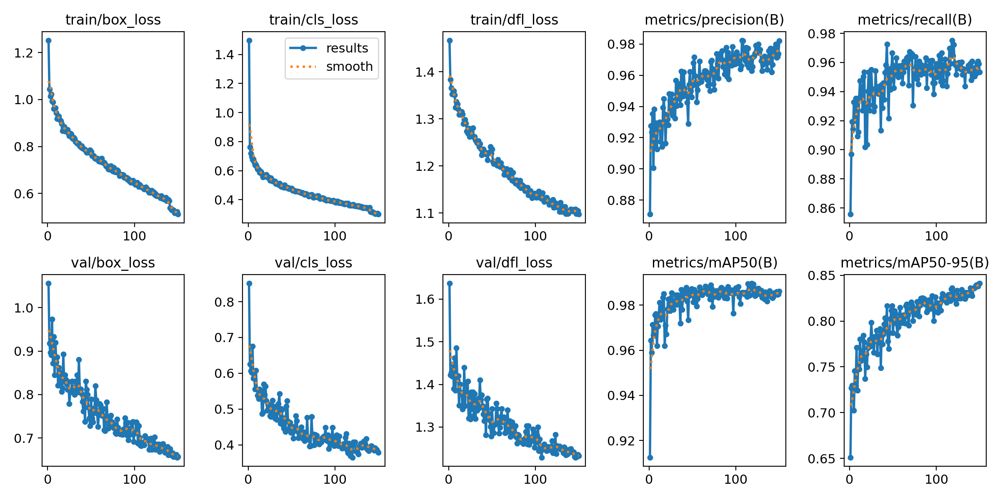

In [ ]:
Image(filename=f'/content/runs/obb/train/results.png', width=1400)


In [ ]:
!yolo task=obb mode=predict model=/content/runs/obb/train/weights/best.pt conf=0.4 source="/content/SIVED/ImageSets/test/images" save=true


Ultralytics YOLOv8.2.15 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-obb summary (fused): 237 layers, 26400646 parameters, 0 gradients, 80.8 GFLOPs

image 1/103 /content/SIVED/ImageSets/test/images/FARAD_101.jpg: 512x512 26.6ms
image 2/103 /content/SIVED/ImageSets/test/images/FARAD_105.jpg: 512x512 26.7ms
image 3/103 /content/SIVED/ImageSets/test/images/FARAD_106.jpg: 512x512 26.6ms
image 4/103 /content/SIVED/ImageSets/test/images/FARAD_107.jpg: 512x512 26.6ms
image 5/103 /content/SIVED/ImageSets/test/images/FARAD_11.jpg: 512x512 26.6ms
image 6/103 /content/SIVED/ImageSets/test/images/FARAD_114.jpg: 512x512 19.8ms
image 7/103 /content/SIVED/ImageSets/test/images/FARAD_122.jpg: 512x512 19.8ms
image 8/103 /content/SIVED/ImageSets/test/images/FARAD_131.jpg: 512x512 19.8ms
image 9/103 /content/SIVED/ImageSets/test/images/FARAD_146.jpg: 512x512 19.8ms
image 10/103 /content/SIVED/ImageSets/test/images/FARAD_153.jpg: 512x512 19.3ms
image 11/103 /content/SIVED/ImageSe

In [ ]:

import supervision as sv

image_paths = sv.list_files_with_extensions(directory="/content/runs/obb/predict",extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 206


In [ ]:
IMAGE_DIR_PATH =  "/content/runs/obb/predict"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

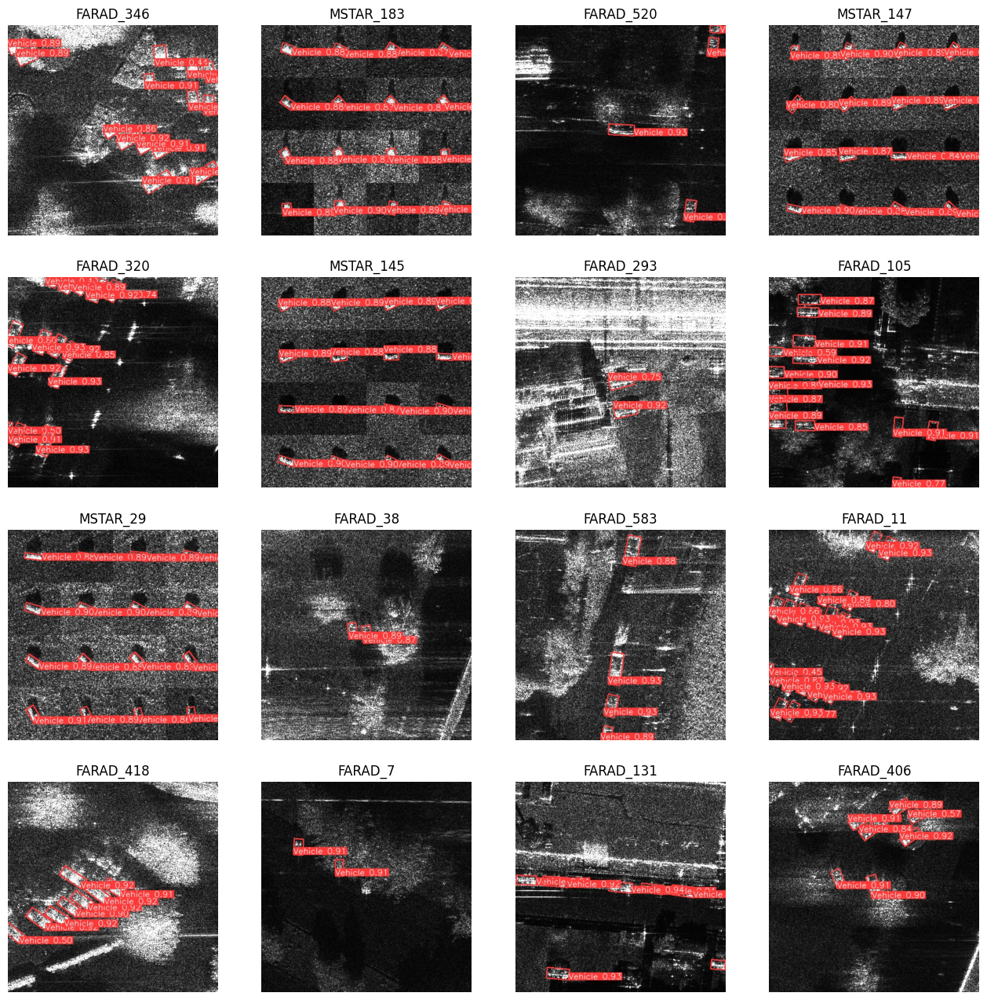

In [ ]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
!zip -r runsyolov8m150epochs.zip /content/runs/obb

  adding: content/runs/obb/ (stored 0%)
  adding: content/runs/obb/train/ (stored 0%)
  adding: content/runs/obb/train/args.yaml (deflated 52%)
  adding: content/runs/obb/train/confusion_matrix.png (deflated 38%)
  adding: content/runs/obb/train/val_batch1_labels.jpg (deflated 4%)
  adding: content/runs/obb/train/results.png (deflated 7%)
  adding: content/runs/obb/train/val_batch0_pred.jpg (deflated 3%)
  adding: content/runs/obb/train/P_curve.png (deflated 25%)
  adding: content/runs/obb/train/results.csv (deflated 86%)
  adding: content/runs/obb/train/train_batch0.jpg (deflated 1%)
  adding: content/runs/obb/train/PR_curve.png (deflated 27%)
  adding: content/runs/obb/train/train_batch1.jpg (deflated 1%)
  adding: content/runs/obb/train/val_batch0_labels.jpg (deflated 4%)
  adding: content/runs/obb/train/train_batch2.jpg (deflated 1%)
  adding: content/runs/obb/train/events.out.tfevents.1715732186.dee1c7eb3877.1740.0 (deflated 86%)
  adding: content/runs/obb/train/F1_curve.png (defl

In [ ]:
!nvidia-smi

Wed Apr 10 03:41:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics roboflow -q

In [ ]:
!pip install supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 kB 3.3 MB/s eta 0:00:00


In [ ]:
from IPython import display
from IPython.display import display, Image
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
import roboflow
from roboflow import Roboflow
import supervision as sv

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.1/78.2 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip /content/gdrive/MyDrive/SIVED.zip

Streaming output truncated to the last 5000 lines.
  inflating: SIVED/Annotations/FARAD_309.xml  
  inflating: SIVED/Annotations/FARAD_31.xml  
  inflating: SIVED/Annotations/FARAD_310.xml  
  inflating: SIVED/Annotations/FARAD_311.xml  
  inflating: SIVED/Annotations/FARAD_312.xml  
  inflating: SIVED/Annotations/FARAD_313.xml  
  inflating: SIVED/Annotations/FARAD_314.xml  
  inflating: SIVED/Annotations/FARAD_315.xml  
  inflating: SIVED/Annotations/FARAD_316.xml  
  inflating: SIVED/Annotations/FARAD_317.xml  
  inflating: SIVED/Annotations/FARAD_318.xml  
  inflating: SIVED/Annotations/FARAD_319.xml  
  inflating: SIVED/Annotations/FARAD_32.xml  
  inflating: SIVED/Annotations/FARAD_320.xml  
  inflating: SIVED/Annotations/FARAD_321.xml  
  inflating: SIVED/Annotations/FARAD_322.xml  
  inflating: SIVED/Annotations/FARAD_323.xml  
  inflating: SIVED/Annotations/FARAD_324.xml  
  inflating: SIVED/Annotations/FARAD_325.xml  
  inflating: SIVED/Annotations/FARAD_326.xml  
  inflating

In [ ]:
import os

# Define the classes and their indixs
class_names =['Vehicle']
class_indixs = {name: index for index, name in enumerate(class_names)}


img_width, img_height = 512, 512


folder_path = "/content/SIVED/ImageSets/valid/labels"


    # Function to normalize coordinates
def normalize_coordinates(coord, max_value):
        return float(coord) / max_value

    # Process each file in the folder
for filename in os.listdir(folder_path):
        if filename.endswith(".txt"):  # assuming the annotation files are .txt files
            file_path = os.path.join(folder_path, filename)
            with open(file_path, 'r') as file:
                lines = file.readlines()


            new_lines = []
            for line in lines:
                parts = line.strip().split(' ')
                if len(parts) == 10:
                    # Extract label and coordinates
                    label = parts[-2]
                    coords = parts[:8]

                    # Get the class index
                    class_index = class_indixs.get(label, -1)
                    if class_index != -1:
                        # Normalize coordinates
                        normalized_coords = [normalize_coordinates(coords[i], img_width if i % 2 == 0 else img_height) for i in range(8)]

                        # Convert to the desired format and add to new lines
                        new_line = f"{class_index} " + " ".join(map(str, normalized_coords))
                        new_lines.append(new_line)

            # Write the converted lines to a new file or overwrite the existing file
            with open(file_path, 'w') as file:
                file.write('\n'.join(new_lines))


In [ ]:
!yolo task=obb mode=train model=yolov8n-obb.pt data=/content/SIVED/data.yaml epochs=150 imgsz=512 batch=8

100% 6.24M/6.24M [00:00<00:00, 198MB/s]
Ultralytics YOLOv8.2.15 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8n-obb.pt, data=/content/SIVED/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

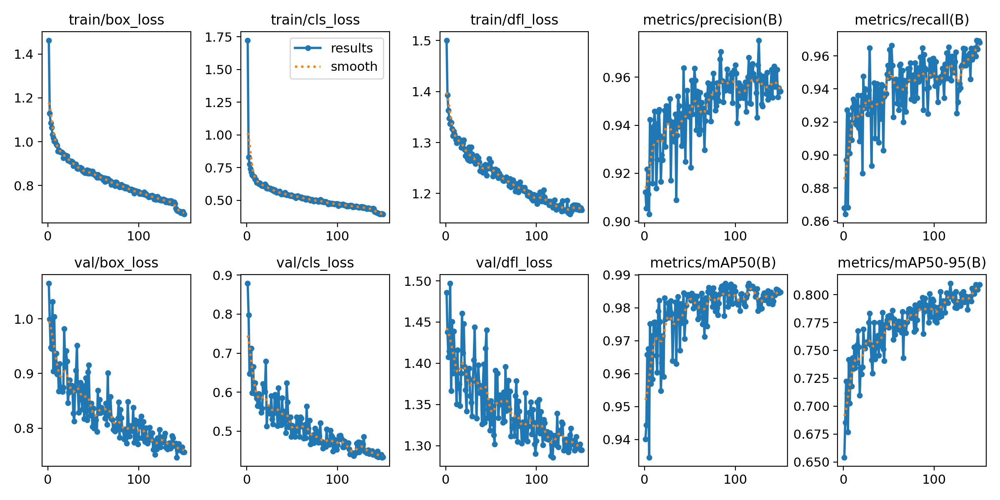

In [ ]:
Image(filename=f'/content/runs/obb/train2/results.png', width=1400)


In [ ]:
!yolo task=obb mode=predict model=/content/runs/obb/train2/weights/best.pt conf=0.4 source="/content/SIVED/ImageSets/test/images" save=true


Ultralytics YOLOv8.2.15 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-obb summary (fused): 187 layers, 3077414 parameters, 0 gradients, 8.3 GFLOPs

image 1/103 /content/SIVED/ImageSets/test/images/FARAD_101.jpg: 512x512 31.9ms
image 2/103 /content/SIVED/ImageSets/test/images/FARAD_105.jpg: 512x512 8.6ms
image 3/103 /content/SIVED/ImageSets/test/images/FARAD_106.jpg: 512x512 9.0ms
image 4/103 /content/SIVED/ImageSets/test/images/FARAD_107.jpg: 512x512 8.4ms
image 5/103 /content/SIVED/ImageSets/test/images/FARAD_11.jpg: 512x512 8.0ms
image 6/103 /content/SIVED/ImageSets/test/images/FARAD_114.jpg: 512x512 8.0ms
image 7/103 /content/SIVED/ImageSets/test/images/FARAD_122.jpg: 512x512 7.9ms
image 8/103 /content/SIVED/ImageSets/test/images/FARAD_131.jpg: 512x512 7.9ms
image 9/103 /content/SIVED/ImageSets/test/images/FARAD_146.jpg: 512x512 8.2ms
image 10/103 /content/SIVED/ImageSets/test/images/FARAD_153.jpg: 512x512 12.2ms
image 11/103 /content/SIVED/ImageSets/test/im

In [ ]:


import supervision as sv

image_paths = sv.list_files_with_extensions(directory="/content/runs/obb/predict2",extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 206


In [ ]:
IMAGE_DIR_PATH =  "/content/runs/obb/predict2"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

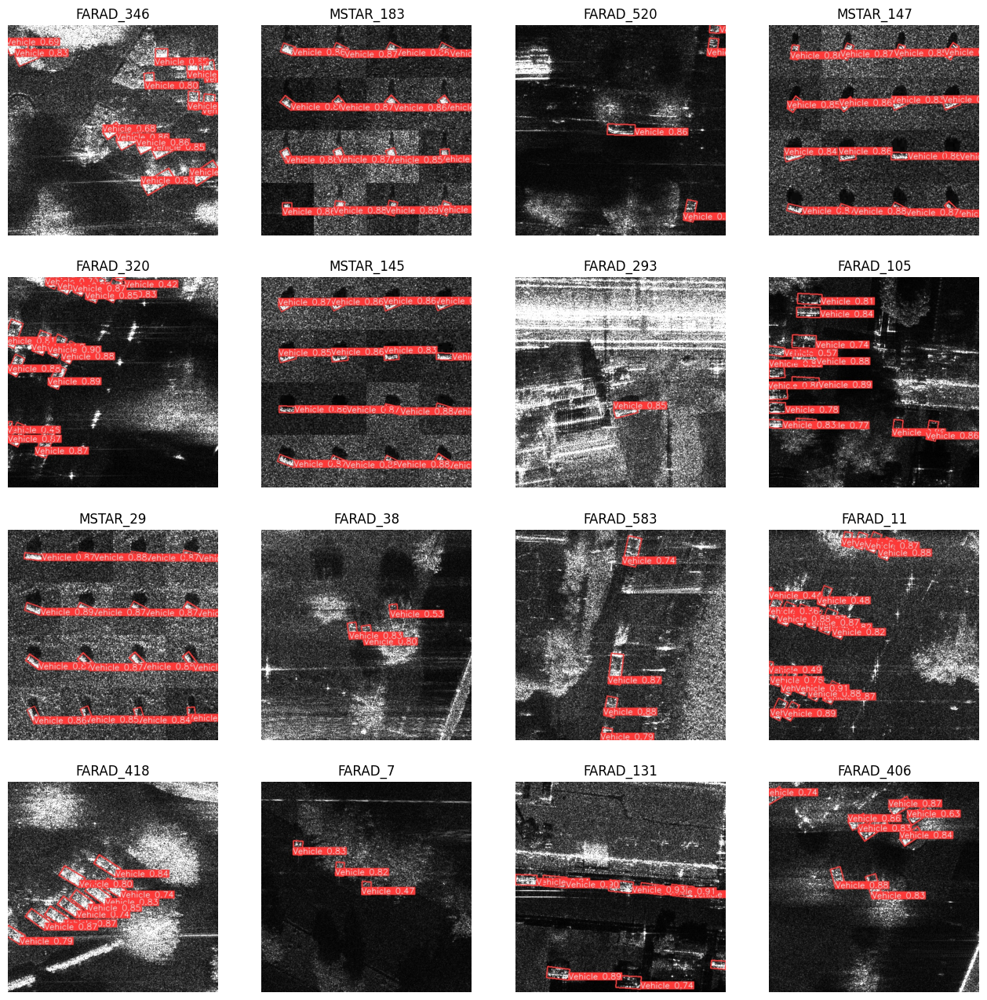

In [ ]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
!zip -r runsyolov8n150epochstrain.zip /content/runs/obb/train2

  adding: content/runs/obb/train2/ (stored 0%)
  adding: content/runs/obb/train2/args.yaml (deflated 52%)
  adding: content/runs/obb/train2/confusion_matrix.png (deflated 38%)
  adding: content/runs/obb/train2/val_batch1_labels.jpg (deflated 4%)
  adding: content/runs/obb/train2/results.png (deflated 6%)
  adding: content/runs/obb/train2/val_batch0_pred.jpg (deflated 3%)
  adding: content/runs/obb/train2/P_curve.png (deflated 23%)
  adding: content/runs/obb/train2/results.csv (deflated 86%)
  adding: content/runs/obb/train2/events.out.tfevents.1715738543.dee1c7eb3877.28316.0 (deflated 85%)
  adding: content/runs/obb/train2/train_batch0.jpg (deflated 1%)
  adding: content/runs/obb/train2/PR_curve.png (deflated 27%)
  adding: content/runs/obb/train2/train_batch1.jpg (deflated 1%)
  adding: content/runs/obb/train2/val_batch0_labels.jpg (deflated 4%)
  adding: content/runs/obb/train2/train_batch2.jpg (deflated 1%)
  adding: content/runs/obb/train2/F1_curve.png (deflated 18%)
  adding: cont

In [ ]:
!zip -r runsyolov8n150epochspredict.zip /content/runs/obb/predict2

  adding: content/runs/obb/predict2/ (stored 0%)
  adding: content/runs/obb/predict2/FARAD_346.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_183.jpg (deflated 1%)
  adding: content/runs/obb/predict2/FARAD_520.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_147.jpg (deflated 5%)
  adding: content/runs/obb/predict2/FARAD_320.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_145.jpg (deflated 5%)
  adding: content/runs/obb/predict2/FARAD_293.jpg (deflated 1%)
  adding: content/runs/obb/predict2/FARAD_105.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_29.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_38.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_583.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_11.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_418.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_7.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_131.jpg (deflated 

In [ ]:
!pip install ultralytics roboflow -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.1/749.1 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 66.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 63.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [ ]:
!pip install supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 kB 3.5 MB/s eta 0:00:00


In [ ]:
from IPython import display
from IPython.display import display, Image
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
import roboflow
from roboflow import Roboflow
import supervision as sv

Ultralytics YOLOv8.1.42 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.1/78.2 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip /content/gdrive/MyDrive/SIVED.zip

Streaming output truncated to the last 5000 lines.
  inflating: SIVED/Annotations/FARAD_309.xml  
  inflating: SIVED/Annotations/FARAD_31.xml  
  inflating: SIVED/Annotations/FARAD_310.xml  
  inflating: SIVED/Annotations/FARAD_311.xml  
  inflating: SIVED/Annotations/FARAD_312.xml  
  inflating: SIVED/Annotations/FARAD_313.xml  
  inflating: SIVED/Annotations/FARAD_314.xml  
  inflating: SIVED/Annotations/FARAD_315.xml  
  inflating: SIVED/Annotations/FARAD_316.xml  
  inflating: SIVED/Annotations/FARAD_317.xml  
  inflating: SIVED/Annotations/FARAD_318.xml  
  inflating: SIVED/Annotations/FARAD_319.xml  
  inflating: SIVED/Annotations/FARAD_32.xml  
  inflating: SIVED/Annotations/FARAD_320.xml  
  inflating: SIVED/Annotations/FARAD_321.xml  
  inflating: SIVED/Annotations/FARAD_322.xml  
  inflating: SIVED/Annotations/FARAD_323.xml  
  inflating: SIVED/Annotations/FARAD_324.xml  
  inflating: SIVED/Annotations/FARAD_325.xml  
  inflating: SIVED/Annotations/FARAD_326.xml  
  inflating

In [ ]:
import os

# Define the classes and their indixs
class_names =['Vehicle']
class_indixs = {name: index for index, name in enumerate(class_names)}


img_width, img_height = 512, 512

#do for train, test, and valid labels
folder_path = "/content/SIVED/ImageSets/valid/labels"


    # Function to normalize coordinates
def normalize_coordinates(coord, max_value):
        return float(coord) / max_value

    # Process each file in the folder
for filename in os.listdir(folder_path):
        if filename.endswith(".txt"):  # assuming the annotation files are .txt files
            file_path = os.path.join(folder_path, filename)
            with open(file_path, 'r') as file:
                lines = file.readlines()


            new_lines = []
            for line in lines:
                parts = line.strip().split(' ')
                if len(parts) == 10:
                    # Extract label and coordinates
                    label = parts[-2]
                    coords = parts[:8]

                    # Get the class index
                    class_index = class_indixs.get(label, -1)
                    if class_index != -1:
                        # Normalize coordinates
                        normalized_coords = [normalize_coordinates(coords[i], img_width if i % 2 == 0 else img_height) for i in range(8)]

                        # Convert to the desired format and add to new lines
                        new_line = f"{class_index} " + " ".join(map(str, normalized_coords))
                        new_lines.append(new_line)

            # Write the converted lines to a new file or overwrite the existing file
            with open(file_path, 'w') as file:
                file.write('\n'.join(new_lines))


In [ ]:
!yolo task=obb mode=train model=yolov8s-obb.pt data=/content/SIVED/data.yaml epochs=150 imgsz=512 batch=8

Ultralytics YOLOv8.2.16 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8s-obb.pt, data=/content/SIVED/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_

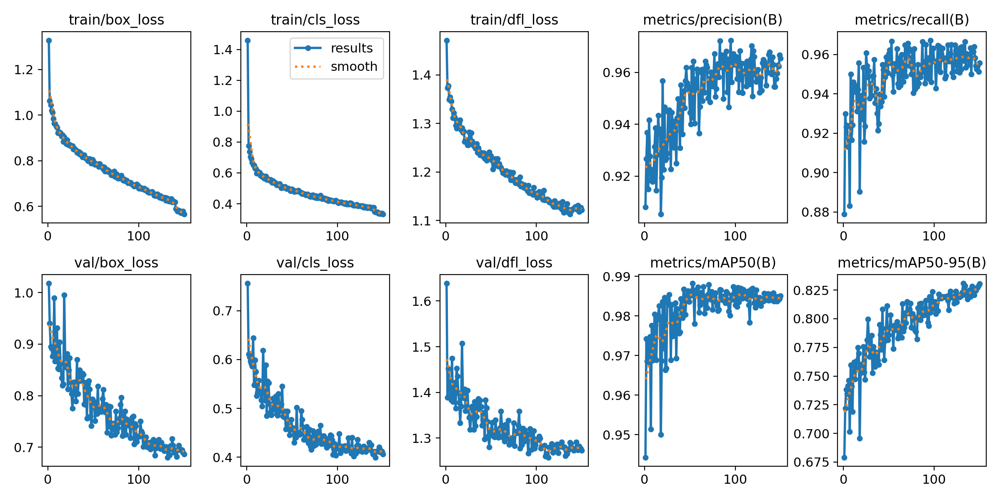

In [ ]:
Image(filename=f'/content/runs/obb/train2/results.png', width=1400)

In [ ]:
!yolo task=obb mode=predict model=/content/runs/obb/train2/weights/best.pt conf=0.4 source="/content/SIVED/ImageSets/test/images" save=true

Ultralytics YOLOv8.2.16 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-obb summary (fused): 187 layers, 11411958 parameters, 0 gradients, 29.4 GFLOPs

image 1/103 /content/SIVED/ImageSets/test/images/FARAD_101.jpg: 512x512 16.8ms
image 2/103 /content/SIVED/ImageSets/test/images/FARAD_105.jpg: 512x512 23.6ms
image 3/103 /content/SIVED/ImageSets/test/images/FARAD_106.jpg: 512x512 23.1ms
image 4/103 /content/SIVED/ImageSets/test/images/FARAD_107.jpg: 512x512 18.8ms
image 5/103 /content/SIVED/ImageSets/test/images/FARAD_11.jpg: 512x512 21.9ms
image 6/103 /content/SIVED/ImageSets/test/images/FARAD_114.jpg: 512x512 16.4ms
image 7/103 /content/SIVED/ImageSets/test/images/FARAD_122.jpg: 512x512 16.0ms
image 8/103 /content/SIVED/ImageSets/test/images/FARAD_131.jpg: 512x512 11.9ms
image 9/103 /content/SIVED/ImageSets/test/images/FARAD_146.jpg: 512x512 14.1ms
image 10/103 /content/SIVED/ImageSets/test/images/FARAD_153.jpg: 512x512 12.9ms
image 11/103 /content/SIVED/ImageSe

In [ ]:


import supervision as sv

image_paths = sv.list_files_with_extensions(directory="/content/runs/obb/predict",extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 206


In [ ]:
IMAGE_DIR_PATH =  "/content/runs/obb/predict"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

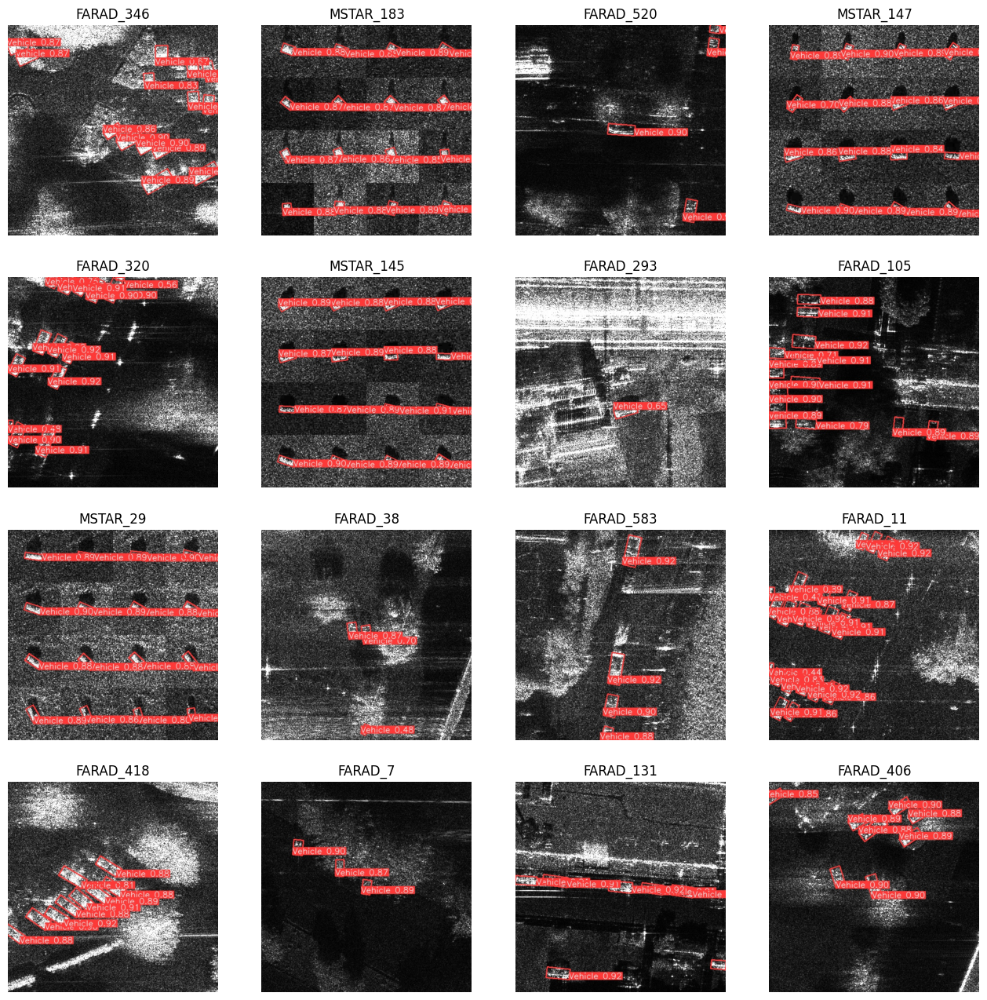

In [ ]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
!zip -r runsyolov8s150epochstrain.zip /content/runs/obb/

  adding: content/runs/obb/ (stored 0%)
  adding: content/runs/obb/train2/ (stored 0%)
  adding: content/runs/obb/train2/args.yaml (deflated 52%)
  adding: content/runs/obb/train2/confusion_matrix.png (deflated 38%)
  adding: content/runs/obb/train2/val_batch1_labels.jpg (deflated 5%)
  adding: content/runs/obb/train2/results.png (deflated 7%)
  adding: content/runs/obb/train2/val_batch0_pred.jpg (deflated 5%)
  adding: content/runs/obb/train2/P_curve.png (deflated 24%)
  adding: content/runs/obb/train2/results.csv (deflated 86%)
  adding: content/runs/obb/train2/events.out.tfevents.1715818633.9e24c3e78ffe.2615.0 (deflated 85%)
  adding: content/runs/obb/train2/train_batch0.jpg (deflated 1%)
  adding: content/runs/obb/train2/PR_curve.png (deflated 27%)
  adding: content/runs/obb/train2/train_batch1.jpg (deflated 1%)
  adding: content/runs/obb/train2/val_batch0_labels.jpg (deflated 5%)
  adding: content/runs/obb/train2/train_batch2.jpg (deflated 1%)
  adding: content/runs/obb/train2/F1_

In [ ]:
!zip -r runsyolov8s100epochspredict.zip /content/runs/obb/predict2

  adding: content/runs/obb/predict2/ (stored 0%)
  adding: content/runs/obb/predict2/MSTAR_29.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_85.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_168.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_423.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_318.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_435.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_163.jpg (deflated 1%)
  adding: content/runs/obb/predict2/FARAD_412.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_425.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_294.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_448.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_156.jpg (deflated 1%)
  adding: content/runs/obb/predict2/FARAD_81.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_221.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_497.jpg (deflate

In [ ]:
!yolo task=obb mode=train model=yolov8l-obb.pt data=/content/SIVED/data.yaml epochs=150 imgsz=512 batch=8

100% 85.4M/85.4M [00:00<00:00, 295MB/s]
Ultralytics YOLOv8.2.2 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8l-obb.pt, data=/content/SIVED/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

In [ ]:
model.summary()

NameError: name 'model' is not defined

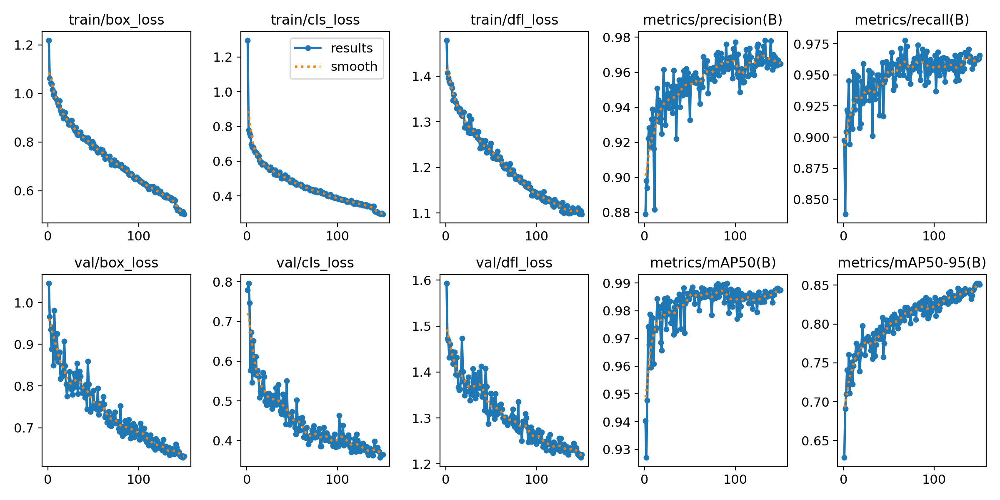

In [ ]:
Image(filename=f'/content/runs/obb/train/results.png', width=1400)

In [ ]:
!yolo task=obb mode=predict model=/content/runs/obb/train/weights/best.pt conf=0.4 source="/content/SIVED/ImageSets/test/images" save=true

Ultralytics YOLOv8.2.2 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-obb summary (fused): 287 layers, 44455830 parameters, 0 gradients, 168.5 GFLOPs

image 1/103 /content/SIVED/ImageSets/test/images/FARAD_101.jpg: 512x512 43.8ms
image 2/103 /content/SIVED/ImageSets/test/images/FARAD_105.jpg: 512x512 43.8ms
image 3/103 /content/SIVED/ImageSets/test/images/FARAD_106.jpg: 512x512 43.7ms
image 4/103 /content/SIVED/ImageSets/test/images/FARAD_107.jpg: 512x512 43.7ms
image 5/103 /content/SIVED/ImageSets/test/images/FARAD_11.jpg: 512x512 43.7ms
image 6/103 /content/SIVED/ImageSets/test/images/FARAD_114.jpg: 512x512 32.5ms
image 7/103 /content/SIVED/ImageSets/test/images/FARAD_122.jpg: 512x512 26.8ms
image 8/103 /content/SIVED/ImageSets/test/images/FARAD_131.jpg: 512x512 26.6ms
image 9/103 /content/SIVED/ImageSets/test/images/FARAD_146.jpg: 512x512 26.1ms
image 10/103 /content/SIVED/ImageSets/test/images/FARAD_153.jpg: 512x512 26.1ms
image 11/103 /content/SIVED/ImageSe

In [ ]:
import supervision as sv

image_paths = sv.list_files_with_extensions(directory="/content/runs/obb/predict",extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 206


In [ ]:
IMAGE_DIR_PATH =  "/content/runs/obb/predict"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

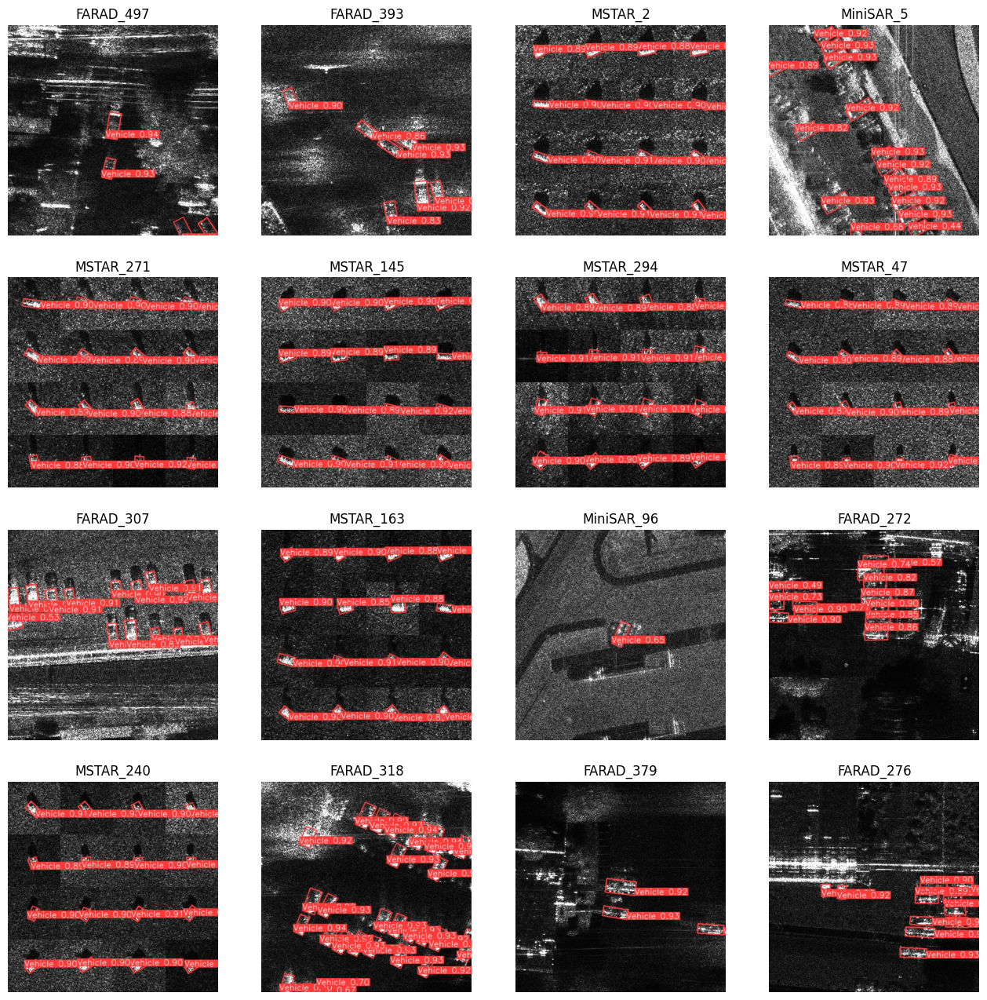

In [ ]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
!zip -r runsyolov8ltrain150epochs.zip /content/runs/obb/

  adding: content/runs/obb/ (stored 0%)
  adding: content/runs/obb/train/ (stored 0%)
  adding: content/runs/obb/train/train_batch0.jpg (deflated 1%)
  adding: content/runs/obb/train/F1_curve.png (deflated 20%)
  adding: content/runs/obb/train/labels.jpg (deflated 35%)
  adding: content/runs/obb/train/results.png (deflated 7%)
  adding: content/runs/obb/train/confusion_matrix_normalized.png (deflated 37%)
  adding: content/runs/obb/train/confusion_matrix.png (deflated 38%)
  adding: content/runs/obb/train/val_batch2_pred.jpg (deflated 5%)
  adding: content/runs/obb/train/train_batch14700.jpg (deflated 2%)
  adding: content/runs/obb/train/val_batch1_labels.jpg (deflated 4%)
  adding: content/runs/obb/train/val_batch0_labels.jpg (deflated 4%)
  adding: content/runs/obb/train/args.yaml (deflated 52%)
  adding: content/runs/obb/train/val_batch2_labels.jpg (deflated 5%)
  adding: content/runs/obb/train/train_batch14701.jpg (deflated 4%)
  adding: content/runs/obb/train/results.csv (deflated

In [ ]:
!zip -r runsyolov8lpredict100epochs.zip /content/runs/obb/predict3

	zip warning: name not matched: /content/runs/obb/predict3

zip error: Nothing to do! (try: zip -r runsyolov8lpredict100epochs.zip . -i /content/runs/obb/predict3)


In [ ]:
!yolo task=obb mode=train model=yolov8x-obb.pt data=/content/SIVED/data.yaml epochs=150 imgsz=512 batch=8

100% 133M/133M [00:00<00:00, 439MB/s] 
Ultralytics YOLOv8.2.21 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8x-obb.pt, data=/content/SIVED/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

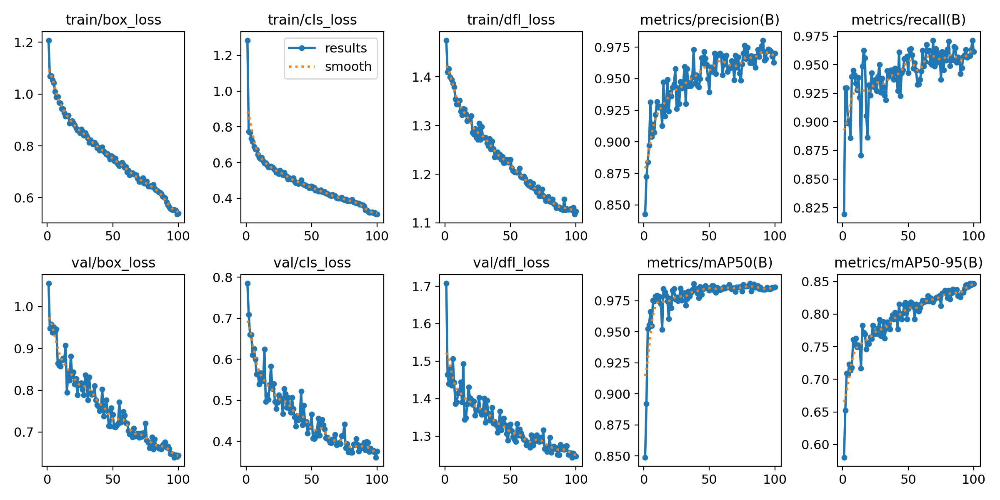

In [ ]:
Image(filename=f'/content/runs/obb/train/results.png', width=1400)

In [ ]:
!yolo task=obb mode=predict model=/content/runs/obb/train/weights/best.pt conf=0.4 source="/content/SIVED/ImageSets/test/images" save=true

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-obb summary (fused): 287 layers, 69450054 parameters, 0 gradients, 263.2 GFLOPs

image 1/103 /content/SIVED/ImageSets/test/images/FARAD_101.jpg: 512x512 57.6ms
image 2/103 /content/SIVED/ImageSets/test/images/FARAD_105.jpg: 512x512 57.6ms
image 3/103 /content/SIVED/ImageSets/test/images/FARAD_106.jpg: 512x512 57.6ms
image 4/103 /content/SIVED/ImageSets/test/images/FARAD_107.jpg: 512x512 43.7ms
image 5/103 /content/SIVED/ImageSets/test/images/FARAD_11.jpg: 512x512 42.5ms
image 6/103 /content/SIVED/ImageSets/test/images/FARAD_114.jpg: 512x512 41.3ms
image 7/103 /content/SIVED/ImageSets/test/images/FARAD_122.jpg: 512x512 29.2ms
image 8/103 /content/SIVED/ImageSets/test/images/FARAD_131.jpg: 512x512 31.4ms
image 9/103 /content/SIVED/ImageSets/test/images/FARAD_146.jpg: 512x512 31.3ms
image 10/103 /content/SIVED/ImageSets/test/images/FARAD_153.jpg: 512x512 29.4ms
image 11/103 /content/SIVED/ImageS

In [ ]:
import supervision as sv

image_paths = sv.list_files_with_extensions(directory="/content/runs/obb/predict",extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 206


In [ ]:
IMAGE_DIR_PATH =  "/content/runs/obb/predict"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

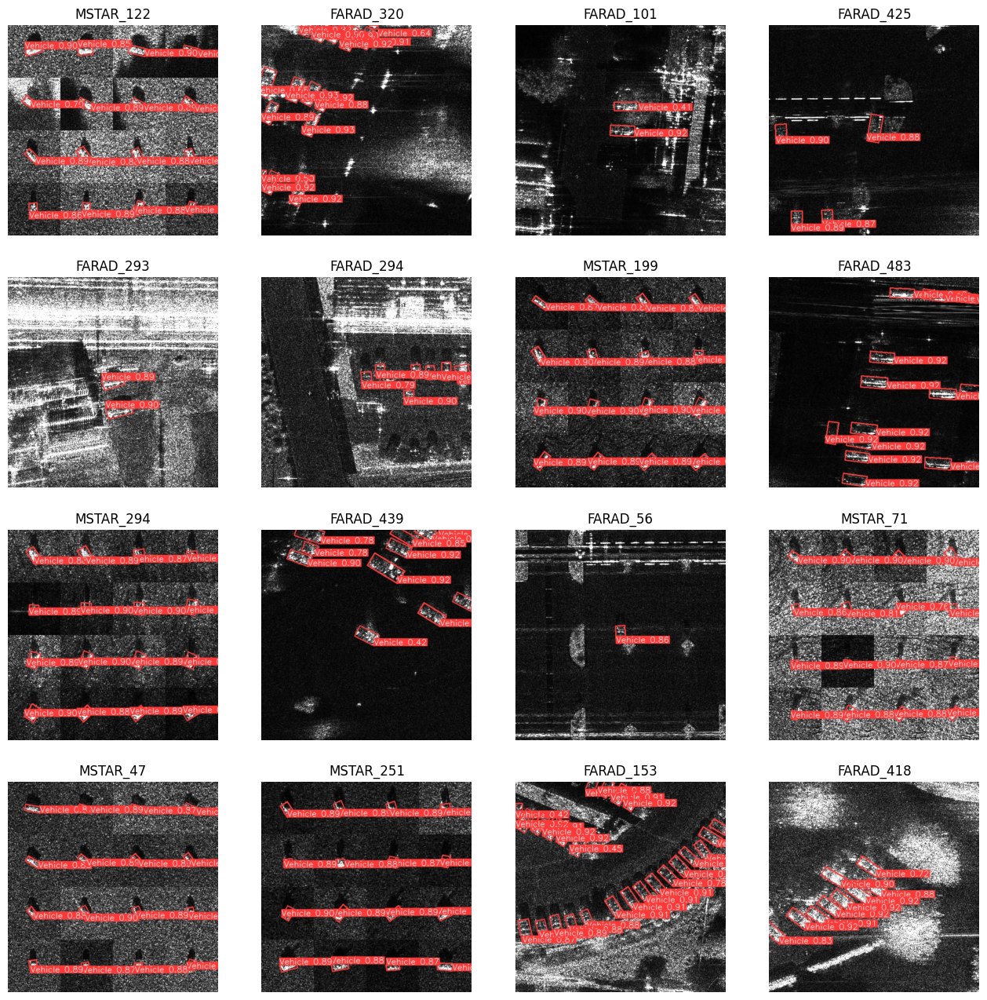

In [ ]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
!zip -r runsyolov8xtrain100epochs.zip /content/runs/obb/

  adding: content/runs/obb/ (stored 0%)
  adding: content/runs/obb/train/ (stored 0%)
  adding: content/runs/obb/train/val_batch1_labels.jpg (deflated 5%)
  adding: content/runs/obb/train/labels.jpg (deflated 35%)
  adding: content/runs/obb/train/confusion_matrix_normalized.png (deflated 37%)
  adding: content/runs/obb/train/results.png (deflated 8%)
  adding: content/runs/obb/train/confusion_matrix.png (deflated 38%)
  adding: content/runs/obb/train/F1_curve.png (deflated 20%)
  adding: content/runs/obb/train/train_batch9450.jpg (deflated 8%)
  adding: content/runs/obb/train/events.out.tfevents.1713271948.f9684807dcbe.2427.0 (deflated 89%)
  adding: content/runs/obb/train/train_batch9451.jpg (deflated 5%)
  adding: content/runs/obb/train/val_batch0_pred.jpg (deflated 5%)
  adding: content/runs/obb/train/P_curve.png (deflated 26%)
  adding: content/runs/obb/train/train_batch2.jpg (deflated 1%)
  adding: content/runs/obb/train/PR_curve.png (deflated 28%)
  adding: content/runs/obb/train

In [ ]:
!zip -r runsyolov8xpredict100epochs.zip /content/runs/obb/predict2

  adding: content/runs/obb/predict2/ (stored 0%)
  adding: content/runs/obb/predict2/MSTAR_221.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_435.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_236.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_306.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_11.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MiniSAR_89.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_289.jpg (deflated 1%)
  adding: content/runs/obb/predict2/FARAD_379.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_131.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_393.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_101.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_38.jpg (deflated 0%)
  adding: content/runs/obb/predict2/MSTAR_271.jpg (deflated 5%)
  adding: content/runs/obb/predict2/FARAD_520.jpg (deflated 0%)
  adding: content/runs/obb/predict2/FARAD_168.jpg (defla

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive
